In [1]:
using DifferentialEquations
using Interpolations
using StaticArrays
using Roots
using Plots
using Pkg

#Pkg.add("ForwardDiff")

using ForwardDiff
using ProgressMeter

In [46]:
setprecision(128)

128

In [2]:
struct Polytrope
    K::Float64
    n::Float64

end

function rho_from_p(p,eos::Polytrope)
    rho_b = sqrt(max(p,1e-14)/eos.K)
    return rho_b + p
end

function cs2_from_p(p,eos::Polytrope)

    rho_b = sqrt(max(p,1e-14)/eos.K)

    return 1/(rho_b/(2p) + 1)

end

function tov_rhs!(du,u,p,r)

    eos = p

    m = u[1]
    pres = u[2]

    if pres <= 0
        du .= 0
        return
    end

    rho = rho_from_p(pres,eos)

    dmdr = 4π*r^2*rho

    dpdr = -(rho+pres)*(m + 4π*r^3*pres)/(r*(r-2m))

    dnudr = 2*(m + 4π*r^3*pres)/(r*(r-2m))

    du[1] = dmdr
    du[2] = dpdr
    du[3] = dnudr

end


function pressure_zero(u,t,integrator)
    u[2]
end

surface_cb = ContinuousCallback(
    pressure_zero,
    integrator -> SciMLBase.terminate!(integrator)
)

function solve_tov(pc,eos::Polytrope)

    r0 = 1e-6
    rmax = 50.0

    rho_c = rho_from_p(pc,eos)

    m0 = 4/3 * π * rho_c * r0^3

    u0 = [m0, pc, 0.0] #@SVector [m0,pc,0.0]

    prob = ODEProblem(tov_rhs!,u0,(r0,rmax),eos)

    sol = solve(prob,
        Vern9(),
        reltol=1e-10,
        abstol=1e-12,
        callback=surface_cb
    )

    r = sol.t

    m = sol[1,:]
    p = sol[2,:]
    nu = sol[3,:]

    R = r[end]
    M = m[end]

    nu_shift = log(1 - 2M/R) - nu[end]

    nu .= nu .+ nu_shift

    return r,m,p,nu,M,R

end

function find_pc(C_target,eos)

    function f(pc)
        r,m,p,nu,M,R = solve_tov(pc,eos)
        M/R - C_target
    end

    pgrid = 10 .^ range(-6,2,length=50)

    fvals = Float64[]

    for p in pgrid
        try
            push!(fvals,f(p))
        catch
            push!(fvals,NaN)
        end
    end

    for i in 1:length(pgrid)-1
        if !isnan(fvals[i]) && !isnan(fvals[i+1])
            if fvals[i]*fvals[i+1] < 0
                return find_zero(f,(pgrid[i],pgrid[i+1]),Bisection())
            end
        end
    end

    error("Target compactness not bracketed")
end

find_pc (generic function with 1 method)

In [12]:
struct Background

    M::Float64
    R::Float64

    r::Vector{Float64}

    m
    p
    eps
    nu
    lam

    cs2

end

function build_background(C,eos)

    pc = find_pc(C,eos)

    r,m,p,nu,M,R = solve_tov(pc,eos)

    # remove duplicate radii
    inds = unique(i -> r[i], eachindex(r))

    r = r[inds]
    m = m[inds]
    p = p[inds]
    nu = nu[inds]
    

    eps = rho_from_p.(p,Ref(eos))

    lam = log.(1 ./ (1 .- 2 .* m ./ r))

    cs2 = cs2_from_p.(p,Ref(eos))

    itp = LinearInterpolation

    m_i = itp(r,m)
    p_i = itp(r,p)
    eps_i = itp(r,eps)
    nu_i = itp(r,nu)
    lam_i = itp(r,lam)
    cs2_i = itp(r,cs2)

    return Background(M,R,r,m_i,p_i,eps_i,nu_i,lam_i,cs2_i)

end

build_background (generic function with 1 method)

# Checks

In [13]:
Msun = 1.47664 #km

eos = Polytrope(100*(Msun)^2, 2)

Cvals = 0.10:0.01:0.24

0.1:0.01:0.24

In [ ]:


backgrounds = [build_background(C,eos) for C in Cvals]

15-element Vector{Background}:
 Background(1.568867541051365, 15.688675548282514, [1.0e-6, 0.035055153486105245, 0.09234161539640565, 0.21452813225229414, 0.41144577897605095, 0.675538774351363, 0.9750613759810243, 1.3180250981799322, 1.7055102242921574, 2.1401750140386704  …  15.67957460212977, 15.683010274584866, 15.687461862681031, 15.68800911049123, 15.688588005614598, 15.688656634992018, 15.688673947954152, 15.688675217269898, 15.688675516255344, 15.688675548282514], 42-element extrapolate(interpolate((::Vector{Float64},), ::Vector{Float64}, Gridded(Linear())), Throw()) with element type Float64:
 1.4448169616312832e-21
 6.223949437087021e-8
 1.1375974734117342e-6
 1.4261851344644446e-5
 0.0001005589578270505
 0.00044450251940119094
 0.0013336909382446118
 0.00328243304420737
 0.007074563334573092
 0.013874431635600155
 ⋮
 1.5688665739024272
 1.5688674857178069
 1.568867520531955
 1.5688675392176288
 1.5688675406551527
 1.568867541017795
 1.5688675410443824
 1.568867541050645
 1.5

In [ ]:
function normalized_grid(bg,N=400)

    r = range(1e-6,bg.R,length=N)

    return r, r ./ bg.R

end

normalized_grid (generic function with 2 methods)

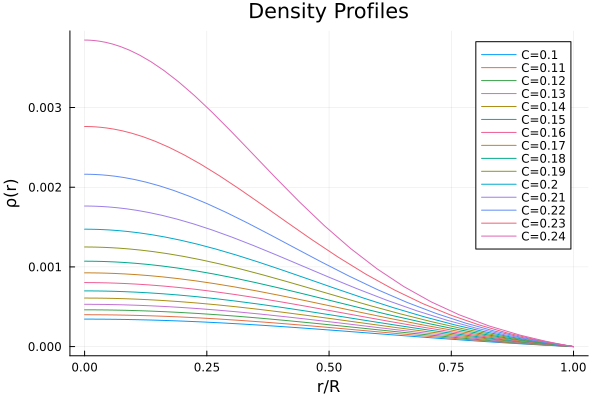

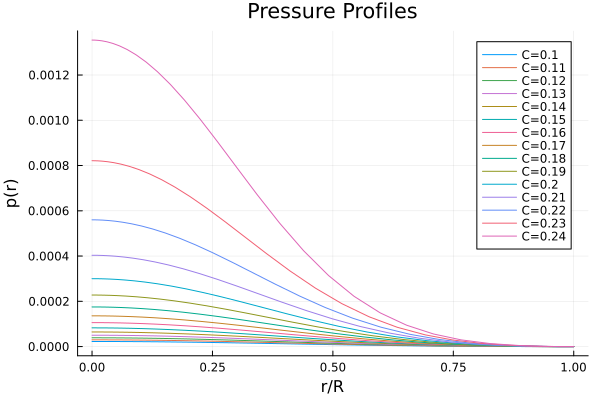

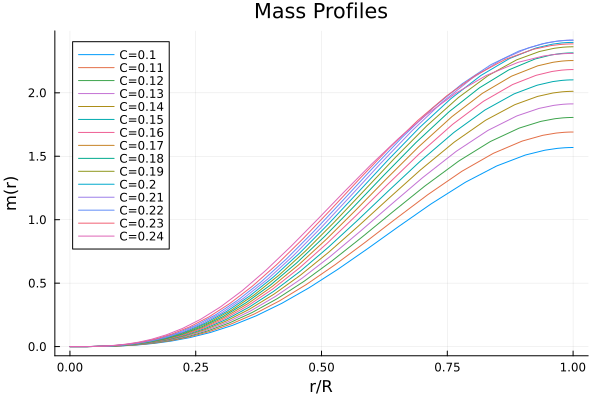

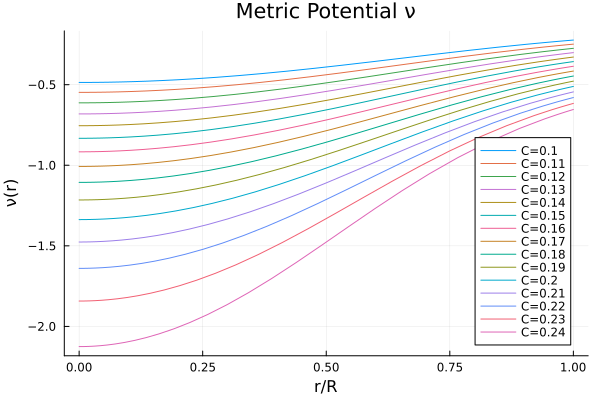

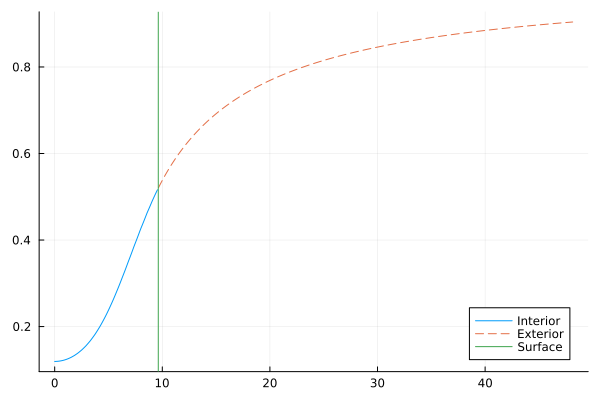

In [ ]:
plt = plot(
    xlabel="r/R",
    ylabel="ρ(r)",
    title="Density Profiles"
)

for bg in backgrounds

    r,x = normalized_grid(bg)

    ρ = bg.eps.(r)

    plot!(plt,x,ρ,label="C=$(round(bg.M/bg.R,digits=3))")

end

display(plt)

plt = plot(
    xlabel="r/R",
    ylabel="p(r)",
    title="Pressure Profiles"
)

for bg in backgrounds

    r,x = normalized_grid(bg)

    p = bg.p.(r)

    plot!(plt,x,p,label="C=$(round(bg.M/bg.R,digits=3))")

end

display(plt)

plt = plot(
    xlabel="r/R",
    ylabel="m(r)",
    title="Mass Profiles"
)

for bg in backgrounds

    r,x = normalized_grid(bg)

    m = bg.m.(r)

    plot!(plt,x,m,label="C=$(round(bg.M/bg.R,digits=3))")

end

display(plt)

plt = plot(
    xlabel="r/R",
    ylabel="ν(r)",
    title="Metric Potential ν"
)

for bg in backgrounds

    r,x = normalized_grid(bg)

    ν = bg.nu.(r)

    plot!(plt,x,ν,label="C=$(round(bg.M/bg.R,digits=3))")

end

display(plt)

bg = backgrounds[end]

r = range(1e-6,5bg.R,length=500)

ν_in = bg.nu.(r[r .<= bg.R])

r_out = r[r .>= bg.R]

ν_out = log.(1 .- 2bg.M ./ r_out)

plot(r[r .<= bg.R],exp.(ν_in),label="Interior")

plot!(r_out,exp.(ν_out),linestyle=:dash,label="Exterior")

vline!([bg.R],label="Surface")

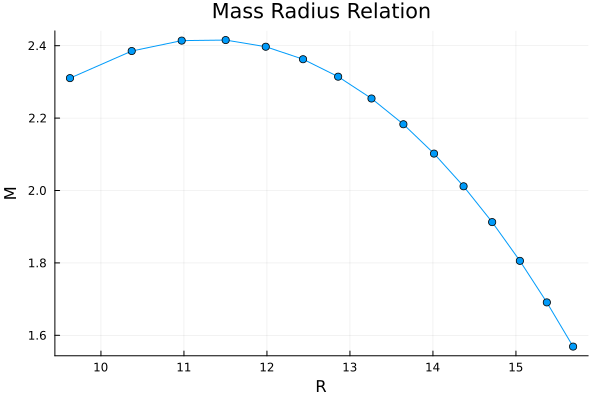

In [ ]:
Mvals = [bg.M for bg in backgrounds]

Rvals = [bg.R for bg in backgrounds]

plot(
    Rvals,
    Mvals,
    marker=:circle,
    xlabel="R",
    ylabel="M",
    title="Mass Radius Relation",
    label=""
)

# Perturbations

In [ ]:
pi

π = 3.1415926535897...

even_rhs! (generic function with 1 method)

In [ ]:


function integrate_mode(A, ω, bg)

    r0 = bg.r[5]
    r1 = bg.r[end]

    y0 = init_conds(r0, ω, bg, A)

    params = EvenParams(bg,ω,2)

    prob = ODEProblem(even_rhs!,y0,(r0,r1),params)

    sol = solve(prob, Rodas5(),
        reltol=1e-10,
        abstol=1e-12)

    return sol

end

function X_surface(A, ω, bg)

    sol = integrate_mode(A,ω,bg)

    return real(sol[end][1])

end

# Complete

In [3]:
"""struct Background
    r
    m
    p
    eps
    nu
    lam
    lam_p
    nu_p
    p_p
    eps_p
    cs2
end"""
Msun = (1.47664) #km

eos = Polytrope((100)*(Msun)^2, 2)

Cvals = 0.10:0.01:0.24
struct Background
    r
    m
    p
    eps
    nu
    lam
    lam_p
    nu_p
    p_p
    eps_p
    cs2
end
struct SourceTerms
    S01
    S01p
    S00
    S0A
    SZ
    S0
    S0p
    S1
    S1p
    SOm
end

function build_zero_sources(r_grid)

    zeros_vec = zeros(length(r_grid))

    interp(v) = LinearInterpolation((r_grid), (v), extrapolation_bc=Line())

    return SourceTerms(
        interp(zeros_vec), # S01
        interp(zeros_vec), # S01p
        interp(zeros_vec), # S00
        interp(zeros_vec), # S0A
        interp(zeros_vec), # SZ
        interp(zeros_vec), # S0
        interp(zeros_vec), # S0p
        interp(zeros_vec), # S1
        interp(zeros_vec), # S1p
        interp(zeros_vec)  # SOm
    )
end


struct EvenParams
    bg::Background
    src
    ω::ComplexF64
    l::Int
end

"""    m_i   = LinearInterpolation((r), (m), extrapolation_bc=Line())
    p_i   = LinearInterpolation((r),(p), extrapolation_bc=Line())
    eps_i = LinearInterpolation((r),(eps), extrapolation_bc=Line())
    nu_i  = LinearInterpolation((r),(nu), extrapolation_bc=Line())
    lam_i = LinearInterpolation((r),(lam), extrapolation_bc=Line())

    lam_p_i = LinearInterpolation((r), (lam_p), extrapolation_bc=Line())
    nu_p_i  = LinearInterpolation((r), (nu_p), extrapolation_bc=Line())

    p_p_i   = LinearInterpolation((r), (p_p), extrapolation_bc=Line())
    eps_p_i = LinearInterpolation((r), (eps_p), extrapolation_bc=Line())

    cs2_i   = LinearInterpolation((r), (cs2), extrapolation_bc=Line())"""

In [4]:


function build_background(C,eos)

    pc = find_pc(C,eos)

    r,m,p,nu,M,R = solve_tov(pc,eos)

    inds = unique(i -> r[i], eachindex(r))

    r = r[inds]
    m = m[inds]
    p = p[inds]
    nu = nu[inds]

    eps = rho_from_p.(p,Ref(eos))
    cs2 = cs2_from_p.(p,Ref(eos))

    lam = log.(1 ./ (1 .- 2 .* m ./ r))

    lam_p = 2 .* (m .+ 4π .* r.^3 .* p) ./ (r .* (r .- 2 .* m))
    nu_p  = lam_p

    p_p = similar(p)
    eps_p = similar(eps)

    for i in 2:length(r)-1
        p_p[i] = (p[i+1]-p[i-1])/(r[i+1]-r[i-1])
        eps_p[i] = (eps[i+1]-eps[i-1])/(r[i+1]-r[i-1])
    end

    p_p[1]=p_p[2]; p_p[end]=p_p[end-1]
    eps_p[1]=eps_p[2]; eps_p[end]=eps_p[end-1]
    # --- SCALE EVERYTHING ---

    r_scaled = r ./ R
    m_scaled = m ./ R

    p_scaled   = p .* R^2
    eps_scaled = eps .* R^2

    # derivatives
    p_p_scaled   = p_p .* R^3
    eps_p_scaled = eps_p .* R^3

    # metric derivatives
    lam_p_scaled = lam_p .* R
    nu_p_scaled  = nu_p  .* R

    # --- rebuild interpolations with scaled quantities ---

    m_i   = LinearInterpolation(r_scaled, m_scaled, extrapolation_bc=Line())
    p_i   = LinearInterpolation(r_scaled, p_scaled, extrapolation_bc=Line())
    eps_i = LinearInterpolation(r_scaled, eps_scaled, extrapolation_bc=Line())
    nu_i  = LinearInterpolation(r_scaled, nu, extrapolation_bc=Line())
    lam_i = LinearInterpolation(r_scaled, lam, extrapolation_bc=Line())

    lam_p_i = LinearInterpolation(r_scaled, lam_p_scaled, extrapolation_bc=Line())
    nu_p_i  = LinearInterpolation(r_scaled, nu_p_scaled, extrapolation_bc=Line())

    p_p_i   = LinearInterpolation(r_scaled, p_p_scaled, extrapolation_bc=Line())
    eps_p_i = LinearInterpolation(r_scaled, eps_p_scaled, extrapolation_bc=Line())

    cs2_i   = LinearInterpolation(r_scaled, cs2, extrapolation_bc=Line())

    return Background(r_scaled, m_i, p_i, eps_i, nu_i, lam_i,lam_p_i, nu_p_i, p_p_i, eps_p_i, cs2_i), M, R
   
end


function build_dense_background(bg, R; N=4000)

    r_dense = range((1e-6), (R)/(R), length=N)

    m   = bg.m.(r_dense)
    p   = bg.p.(r_dense)
    eps = bg.eps.(r_dense)
    nu  = bg.nu.(r_dense)
    lam = bg.lam.(r_dense)

    lam_p = bg.lam_p.(r_dense)
    nu_p  = bg.nu_p.(r_dense)

    p_p   = bg.p_p.(r_dense)
    eps_p = bg.eps_p.(r_dense)

    cs2   = bg.cs2.(r_dense)

    return Background(
        collect(r_dense),
        LinearInterpolation(r_dense,m,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,p,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,eps,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,nu,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,lam,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,lam_p,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,nu_p,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,p_p,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,eps_p,extrapolation_bc=Line()),
        LinearInterpolation(r_dense,cs2,extrapolation_bc=Line())
    )
end




function init_conds(r0, ω, bg, A)

    p0   = bg.p(r0)
    eps0 = bg.eps(r0)
    nu0  = bg.nu(r0)

    W0 = r0
    K0 = (A) * R^2

    X0 = ((1)/(6))*exp(-nu0/(2))*(p0+eps0)*(-(3*ω^2*W0) + exp(nu0)*(3*K0 + 8π*W0*(3*p0+eps0))) * R^4

    H10 = ((2)/(3))*(K0 + (4π)*W0 * (p0+eps0)) * R^2
    y0 = ComplexF64[X0, W0, H10, K0]
    return y0 #./ maximum(abs.(y0))

end

function integrate_mode(A, ω, bg, src)

    r0 = 1e-4#bg.r[2]#bg.r[2]
    r1 = bg.r[end]

    y0 = init_conds(r0, ω, bg, A)

    params = EvenParams(bg,src,ω,2)

    prob = ODEProblem(even_rhs!,y0,((r0),(r1)),params)
    step_counter[] = 0
    
    sol = solve(prob,KenCarp47(autodiff=false),
        callback = cb_log,
        reltol=1e-8,
        abstol=1e-10,
        maxiters=1e7)

    return sol
end

function X_surface(A, ω, bg, src)

    sol = integrate_mode(A,ω,bg,src)

    return real(sol[end][1])

end

function find_bracket(f; amin=-6, amax=6, N=200)

    As = 10 .^ range(amin, amax, length=N)
    As = vcat(-reverse(As), As)  # include negatives

    vals = [f(A) for A in As]

    for i in 1:length(As)-1
        if vals[i]*vals[i+1] < 0
            return As[i], As[i+1]
        end
    end

    error("No bracket found")
end

function solve_shooting(ω,bg,src)

    f(A) = X_surface(A,ω,bg,src)

    a, b = find_bracket(f; amin=-4, amax=5)   # adjust range if needed
    Astar = find_zero(f, (a, b))

    sol = integrate_mode(Astar,ω,bg,src)

    return Astar, sol
end

solve_shooting (generic function with 1 method)

In [ ]:
H = H1 = K = L^-2
W = V = 0
X = L^-2

In [ ]:
H~ = L^2 * H

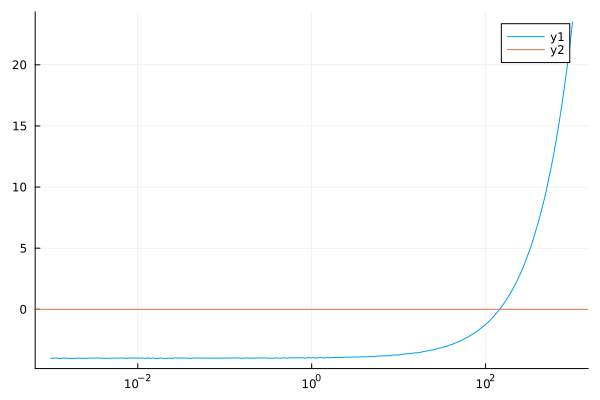

In [77]:
As_pos = 10 .^ range(-3, 3, length=200)
As_neg = -As_pos

As = As_pos#vcat(As_neg, As_pos) #As = range(-10.0, 50.0, length=150)


vals = [X_surface(A, om, bg, src) for A in As]

using Plots
plot(As, vals, xscale=:log10)
hline!([0])

In [13]:
println(X_surface(1e-2, om, bg, src))

UndefVarError: UndefVarError: `src` not defined in `Main`
Suggestion: check for spelling errors or missing imports.
Hint: a global variable of this name also exists in Graphs.

In [64]:
println(X_surface(1e-6, om, bg, src))
println(X_surface(1e-2, om, bg, src))
println(X_surface(1, om, bg, src))

-3.994923420975793
-4.007708975698515
-3.958057517313851


In [51]:
println(sol[end])

ComplexF64[4.209236841032934e-27 + 0.0im, 3.407355689079324e-12 + 0.0im, 3.7455144556322084e-17 + 0.0im, 7.185896521831568e-17 + 0.0im]


In [ ]:
function even_rhs!(dy,y,p,r)
     bg = p.bg
     src = p.src
     om  = p.ω
     l  = p.l

     S01  = src.S01(r)
     S01p = src.S01p(r)
     S00  = src.S00(r)
     S0A  = src.S0A(r)
     SZ   = src.SZ(r)
     S0   = src.S0(r)
     S0p  = src.S0p(r)
     S1   = src.S1(r)
     S1p  = src.S1p(r)
     SOm  = src.SOm(r)

     m   = bg.m(r)
     p0  = bg.p(r)
     eps = bg.eps(r)
     nu  = bg.nu(r)
     lam = bg.lam(r)

     lam_p = bg.lam_p(r)
     nu_p  = bg.nu_p(r)
     p_prime = bg.p_p(r)
     eps_prime = bg.eps_p(r)
     cs2 = bg.cs2(r)

     X  = y[1]
     W  = y[2]
     H1 = y[3]
     K  = y[4]

     exp_lam = exp(lam)
     exp_nu  = exp(nu)

     Eh = X / cs2

     Hdenom = r*(2*r + 3*m + 4*pi*r^3 *p0) 

     H = (8*exp(-nu/2)*pi*r^4 *X + 2*r^2 *K - exp(-nu)*r^4 *om^2 *K + exp(-lam)*r*K*m - 3*exp(-lam)*K*m^2 + 4*exp(-lam)*pi*r^4 *K*p0 - 16*exp(-lam)*pi^2 *r^6 *K*p0^2 + H1*(-3*r*m + r^4 *(exp(-lam-nu)*om^2 - 12*pi*p0)) - 8*pi*r^2 *S0 - 16*exp(-lam)*pi*r^2 *S1)/Hdenom

     Vhnum1 = exp(-lam + nu/2) *(-4*S1 - exp(lam)*(2*(S1-2*SZ+ SOm) + r^2*(8*pi*S1 *(p0-eps) + H*(eps + p0))) + 2*exp(lam/2)*r*W*p_prime - 2*r*S1p)/r^2
     Vh = exp(nu/2) *(2*X + Vhnum1)/(2*om^2 * (eps + p0))
     
     dH1dr =  (exp(lam) / r) * H + (4 * pi * r * (eps - p0) * exp(lam) - (2 * m * exp(lam) / r^2) - (3 / r)) * H1 + (exp(lam) / r) * K - 16 * pi * ((eps + p0) / r) * exp(lam) * Vh +  16 * pi * (exp(lam) / r) * SZ


     dKdr = (H / r) + (l * (l + 1) / (2 * r)) * H1 + ((nu_p / 2) - ((l + 1) / r)) * K - 8 * pi * ((eps + p0) / r) * exp(lam / 2) * W + (16 * pi / r) * SZ

     dWhdr = (r / 2) * exp(lam / 2) * H + r * exp(lam / 2) * K + (r * exp((lam - nu) / 2) / (eps + p0)) * Eh -  W * (l + 1) / r - (l * (l + 1) / r) * exp(lam / 2) * Vh -  exp(lam / 2) * S00 / (r * (eps + p0)) + 8 * pi * r * exp(lam / 2) * SZ

     dXhdr = ((eps + p0) / 2) * exp(nu / 2) * ((1 / r) - (nu_p / 2)) * H + ((eps + p0) / 2) * exp(nu / 2) *(om^2 * r * exp(-nu) + (l * (l + 1) / (2 * r))) * H1 + ((eps + p0) / 2) * exp(nu / 2) *((3 * nu_p / 2) - (1 / r)) * K - (l / r) * X - ((eps + p0) / r) * exp((lam + nu) / 2) * (om^2 * exp(-nu) + (exp(-lam) / (4 * r^2)) * ( exp(2 * lam) * (1 + 8 * pi * r^2 * p0)^2 + 2 * exp(lam) * (3 + 8 * pi * r^2 * p0 ) - 7 )) * W + (l * (l + 1) / r^2) * exp(nu / 2) * p_prime * Vh +(exp(nu / 2) / (2 * r^3)) * (2 * l - 1 + exp(lam) * (1 + 8 * pi * r^2 * p0)) * S0 + (exp(nu / 2) / r^2) * S0p - (exp(nu / 2) / r^3) * (l * (l + 1) + 8 * pi * r^2 * (eps + p0)) * S1 - (2 * exp(nu / 2) / r^3) * SOm
     
     dy[1] = dXhdr 
     dy[2] = dWhdr 
     dy[3] = dH1dr 
     dy[4] = dKdr 
     #print("r: ", r, " X: ", X, " W: ", W, " H1: ", H1, " K: ", K, "Vh: ", Vh, "H: ", H, "\n") 

end

even_rhs! (generic function with 1 method)

In [6]:
bg_sparse, M, R = build_background(0.2, eos)

bg = build_dense_background(bg_sparse, R)

Background([1.0e-6, 0.0002510622655663916, 0.0005011245311327832, 0.0007511867966991748, 0.0010012490622655665, 0.001251311327831958, 0.0015013735933983496, 0.001751435858964741, 0.002001498124531133, 0.0022515603900975243  …  0.9977494396099025, 0.9979995018754688, 0.9982495641410353, 0.9984996264066016, 0.9987496886721681, 0.9989997509377344, 0.9992498132033009, 0.9994998754688672, 0.9997499377344337, 1.0], 4000-element extrapolate(scale(interpolate(::Vector{Float64}, BSpline(Linear())), (1.0e-6:0.0002500622655663916:1.0,)), Line()) with element type Float64:
 5.034377371361904e-12
 1.378536969670691e-9
 2.75203956197002e-9
 4.125542154269349e-9
 5.499044746568679e-9
 6.872547338868006e-9
 8.246049931167338e-9
 9.619552523466665e-9
 1.0993055115765994e-8
 1.2366557708065322e-8
 ⋮
 0.19999639384828427
 0.1999973542521894
 0.19999831465609452
 0.19999886683937224
 0.19999926600611262
 0.19999958735571619
 0.19999982028748944
 0.1999999363432386
 0.2000000000116187, 4000-element extrapo

In [45]:
println(abs(sol[end][1]))   # X
println(abs(sol[end][2]))   # W

7.401691912633616e-17
2.723953252774493


In [7]:
om = (1 + 0im)

1 + 0im

In [18]:
X_R  = sol[end][1]
W_R  = sol[end][2]
H1_R = sol[end][3]
K_R  = sol[end][4]

print("X(R) = $X_R\n")
print("W(R) = $W_R\n")
print("H1(R) = $H1_R\n")
print("K(R) = $K_R\n")

X(R) = -3.769835694854953e-19 + 0.0im
W(R) = -5.828258089838449e-6 + 0.0im
H1(R) = -5.2232386408229956e-8 + 0.0im
K(R) = -4.2735279325141404e-8 + 0.0im


In [12]:
log_data = (
    r = Float64[],
    X = ComplexF64[],
    W = ComplexF64[],
    H1 = ComplexF64[],
    K = ComplexF64[],
    Vh = ComplexF64[],
    H = ComplexF64[]
)

step_counter = Ref(0)

function log_condition(u, t, integrator)
    step_counter[] += 1
    return step_counter[] % 10 == 0
end


function log_callback!(integrator)

    params = integrator.p
    bg = params.bg

    r = integrator.t

    X, W, H1, K = integrator.u

    # recompute minimal needed quantities
    p0  = bg.p(r)
    eps = bg.eps(r)
    lam = bg.lam(r)
    nu  = bg.nu(r)
    m = bg.m(r)
    p_prime = bg.p_p(r)
    
    exp_lam = exp(lam)
    cs2 = bg.cs2(r)
    Eh = X / cs2

    S0 = params.src.S0(r)
    S1 = params.src.S1(r)
    SZ = params.src.SZ(r)
    S0p = params.src.S0p(r)
    S1p = params.src.S1p(r)
    SOm = params.src.SOm(r)
    
    om = params.ω
    Hdenom = 4*r + 6*m + 8*pi*r^3 *p0 # r*(2*r + 3*m + 4*pi*r^3*p0)

    H = (2*(8*exp(-nu/2)*pi*r^3 *X + H1*(-3*m + r^3 *(exp(-lam-nu) * om^2 - 12*pi*p0)) + K*(2*r - exp(-nu)*r^3 *om^2 -(exp_lam * (m + 4*pi*r^3 *p0) *(-r + 3*m + 4*pi*r^3 *p0)/r) ) - 8*pi*r* S0 - 16*exp(-lam)*pi*r*S1))/Hdenom #(8*pi*r^4*X*exp(-nu/2) +  2*r^2*K - exp(-nu)*r^4*om^2*K + exp_lam*r*K*m -3*exp_lam*K*m^2 + 4*exp_lam*pi*r^4*p0*K - 16*exp_lam*pi*r^3*K*m*p0 - 16*exp_lam*pi^2*r^6*K*p0^2 + H1*(-3*r*m + r^4*(exp(-lam-nu)*om^2 - 12*pi*p0)) - 8*pi*r^2 *S0 - 16*exp(-lam)*pi*r^2 *S1 ) / Hdenom


    Vhnum1 = 2* exp(-lam + (nu/2)) *(-2*exp_lam *SZ + exp_lam * SOm + S1 * (2 + exp_lam + 4*exp_lam *pi*r^2 *p0 - 4* exp_lam * pi* r^2 * eps) - exp(lam/2) * r * W * p_prime + r* S1p)
    Vhnum2 = exp(nu/2) * (2 * X  - exp(nu/2) * H * (p0 + eps) - (Vhnum1 / r^2))

    Vh = Vhnum2 / (2 * om^2 * (eps + p0))

    push!(log_data.r, r)
    push!(log_data.X, X)
    push!(log_data.W, W)
    push!(log_data.H1, H1)
    push!(log_data.K, K)
    push!(log_data.Vh, Vh)
    push!(log_data.H, H)

    return nothing
end

cb_log = DiscreteCallback(log_condition, log_callback!)   # every 10 steps

DiscreteCallback{typeof(log_condition), typeof(log_callback!), typeof(SciMLBase.INITIALIZE_DEFAULT), typeof(SciMLBase.FINALIZE_DEFAULT), Nothing, Tuple{}}(Main.log_condition, Main.log_callback!, SciMLBase.INITIALIZE_DEFAULT, SciMLBase.FINALIZE_DEFAULT, Bool[1, 1], nothing, ())

In [7]:
"""bg_sparse, M, R = build_background(0.2, eos)

bg = build_dense_background(bg_sparse, R)

src = build_zero_sources(bg.r)"""

function zerilli_surface(H1R, KR, R, M)

    ZR =
        R^3 * ((2M - R)*H1R + R*KR) /(3M + 2R)

    dZR = R*(-6*(2M^3 + M^2*R + M*R^2 - R^3)*H1R + R*(3M^2 + 6*M*R - 2*R^2) * KR)/((3M + 2R)^2 )       #(R^2 * (6*(2M^3 + M^2*R + M*R^2 - R^3)*H1R + R*(-3M^2 - 6M*R + 2R^2)*KR)) /((2M - R)*(3M + 2R)^2)

    return ZR, dZR
end

function yZ_single(ω, bg, src)

    M = bg.m(bg.r[end])
    R = bg.r[end]
    C = M/R

    Astar, sol = solve_shooting(ω, bg, src)

    X, W, H1R, KR = sol.u[end]

    ZR, dZR = zerilli_surface(H1R, KR, R, M)

    factor = 2M/(1 - 2C)

    return factor * (dZR/ZR)
end

using ProgressMeter

function scan_yZ(ω_values, bg, src)

    yZ = ComplexF64[]

    prog = Progress(length(ω_values), desc="Scanning ω")

    for ω in ω_values

        push!(yZ, yZ_single(ω, bg, src))

        next!(prog)

    end

    return yZ
end

scan_yZ (generic function with 1 method)

In [14]:
bg_sparse, M, R = build_background(0.2, eos)

bg = build_dense_background(bg_sparse, R)

src = build_zero_sources(bg.r)

om = (1 + 0im)#* (3e5/ R)

Astar, sol = solve_shooting(om,bg,src)



(6.105055951209154e-7, ODESolution{ComplexF64, 2, Vector{Vector{ComplexF64}}, Nothing, Nothing, Vector{Float64}, Vector{Vector{Vector{ComplexF64}}}, Nothing, ODEProblem{Vector{ComplexF64}, Tuple{Float64, Float64}, true, EvenParams, ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ComplexF64}, Vector{ComplexF64}, EvenParams, Float64}}}, false}, LinearAlgebra.UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing, Nothing, Nothing}, Base.Pairs{Symbol, Union{}, Nothing, @NamedTuple{}}, SciMLBase.StandardODEProblem}, KenCarp47{0, AutoFiniteDiff{Val{:forward}, Val{:forward}, Val{:hcentral}, Nothing, Nothing, Int64}, Nothing, NLNewton{Rational{Int64}, Rational{Int64}, Rational{Int64}, Nothing}, typeof(OrdinaryDiffEqCore.DEFAULT_PRECS), Val{:forward}(), true, noth

In [ ]:
bg_sparse, M, R = build_background(0.2, eos)

bg = build_dense_background(bg_sparse, R)

src = build_zero_sources(bg.r)

ω = (1 + 0im) #* (3e5/ R)

Astarscaled, solrescaled = solve_shooting(ω,bg,src)


(8.639082896030026e-9, ODESolution{ComplexF64, 2, Vector{Vector{ComplexF64}}, Nothing, Nothing, Vector{Float64}, Vector{Vector{Vector{ComplexF64}}}, Nothing, ODEProblem{Vector{ComplexF64}, Tuple{Float64, Float64}, true, EvenParams, ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ComplexF64}, Vector{ComplexF64}, EvenParams, Float64}}}, false}, LinearAlgebra.UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing, Nothing, Nothing}, Base.Pairs{Symbol, Union{}, Nothing, @NamedTuple{}}, SciMLBase.StandardODEProblem}, KenCarp47{0, AutoFiniteDiff{Val{:forward}, Val{:forward}, Val{:hcentral}, Nothing, Nothing, Int64}, Nothing, NLNewton{Rational{Int64}, Rational{Int64}, Rational{Int64}, Nothing}, typeof(OrdinaryDiffEqCore.DEFAULT_PRECS), Val{:forward}(), true, noth

In [43]:
Astarscaled

8.637874487959704e-9

In [16]:
init_conds(1e-4, om, bg, Astar)

4-element Vector{ComplexF64}:
 -0.010041101267554777 - 0.0im
                0.0001 + 0.0im
   0.03906177705377631 + 0.0im
  8.770390600869143e-5 + 0.0im

In [ ]:
(3.735759543408377e-9 + 0.0im) 

3.735759543408377e-9 + 0.0im

In [ ]:
X
W
H1
K

In [44]:
(-3.009813588334708e-6 - 0.0im) * R^2

-0.000432383274067632 - 0.0im

In [46]:
(8.639082896030026e-9 + 0.0im) * R^2

1.2410718597339743e-6 + 0.0im

In [27]:
(-3.009813588883794e-6 - 0.0im) / (1/R)^2

-0.0004323832741465125 - 0.0im

In [45]:
R

11.985734232981656

In [ ]:
W > H1 > X > K

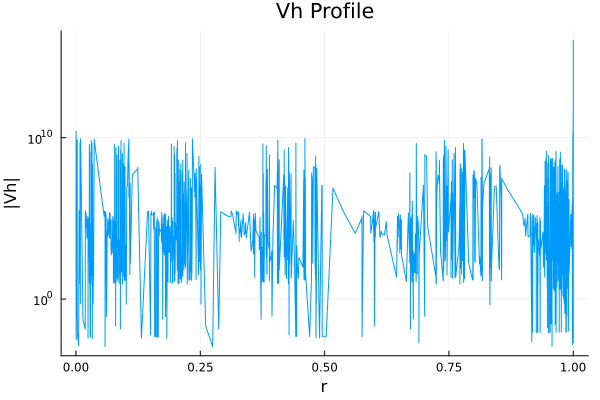

In [17]:
using Plots

idx = sortperm(log_data.r)

r_sorted  = log_data.r[idx]
Vh_sorted = log_data.Vh[idx]

plot(r_sorted, abs.(Vh_sorted), yscale=:log10, xlabel="r", ylabel="|Vh|", title="Vh Profile", label="")

In [57]:
X_real = real.(log_data.X)
X_imag = imag.(log_data.X)

Xr = X_real[idx]
Xi = X_imag[idx]

using Plots

using Plots
gr()

p = plot(r_sorted, Xr, label="Re(X)", yscale=:log10, xlabel="r", ylabel="X(r)", title="X Profile")
#plot!(p, r_sorted, Xi, label="Im(X)")

display(p)

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Arun KG\.julia\packages\PlotUtils\HX80C\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Arun KG\.julia\packages\PlotUtils\HX80C\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Arun KG\.julia\packages\PlotUtils\HX80C\src\ticks.jl:194


In [60]:
minimum(Xr), maximum(Xr)

(-0.02609719520599242, 0.0264082137114945)

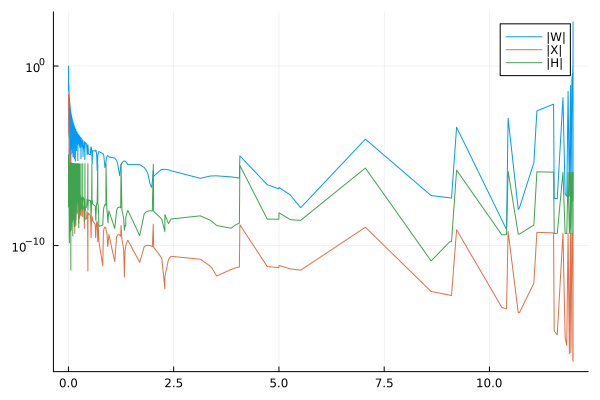

In [13]:
plot(r_sorted, abs.(log_data.W[idx]), yscale=:log10, label="|W|")
plot!(r_sorted, abs.(log_data.X[idx]), label="|X|")
plot!(r_sorted, abs.(log_data.H[idx]), label="|H|")

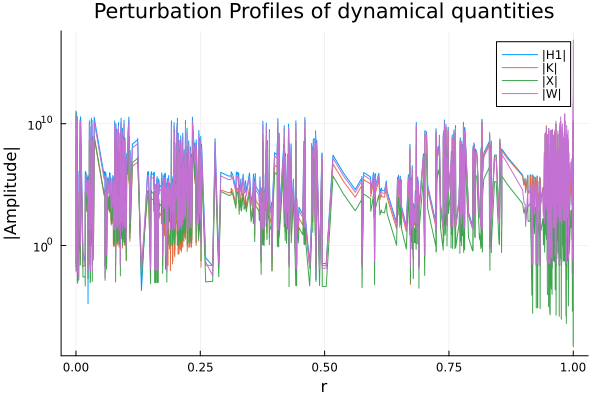

In [18]:
# Omega = 1/R
plot(r_sorted, abs.(log_data.H1[idx]), label="|H1|", yscale=:log10, xlabel="r", ylabel="|Amplitude|", title="Perturbation Profiles of dynamical quantities" )
plot!(r_sorted, abs.(log_data.K[idx]), label="|K|")
plot!(r_sorted, abs.(log_data.X[idx]), label="|X|")
plot!(r_sorted, abs.(log_data.W[idx]), label="|W|")



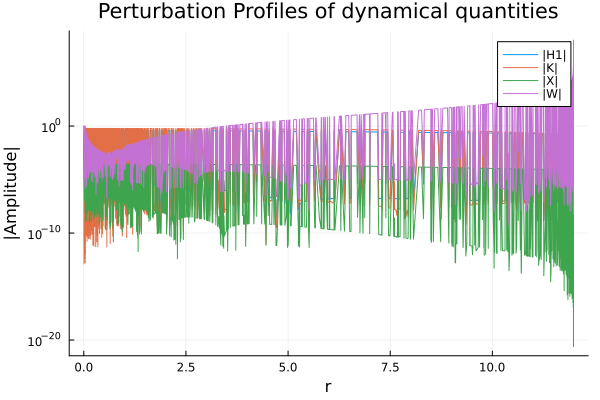

In [35]:
# Omega = 1/R
plot(r_sorted, abs.(log_data.H1[idx]), label="|H1|", yscale=:log10, xlabel="r", ylabel="|Amplitude|", title="Perturbation Profiles of dynamical quantities" )
plot!(r_sorted, abs.(log_data.K[idx]), label="|K|")
plot!(r_sorted, abs.(log_data.X[idx]), label="|X|")
plot!(r_sorted, abs.(log_data.W[idx]), label="|W|")



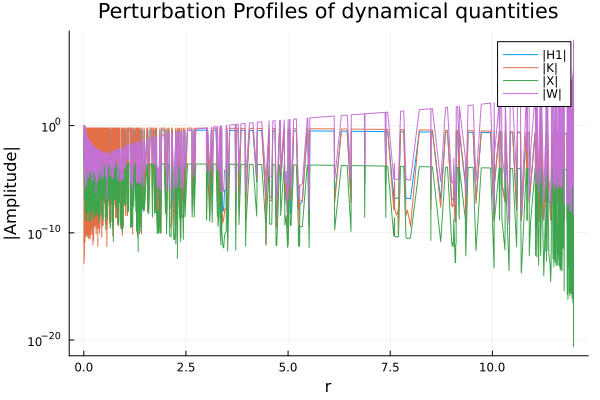

In [27]:
# Omega = 1/R
plot(r_sorted, abs.(log_data.H1[idx]), label="|H1|", yscale=:log10, xlabel="r", ylabel="|Amplitude|", title="Perturbation Profiles of dynamical quantities" )
plot!(r_sorted, abs.(log_data.K[idx]), label="|K|")
plot!(r_sorted, abs.(log_data.X[idx]), label="|X|")
plot!(r_sorted, abs.(log_data.W[idx]), label="|W|")



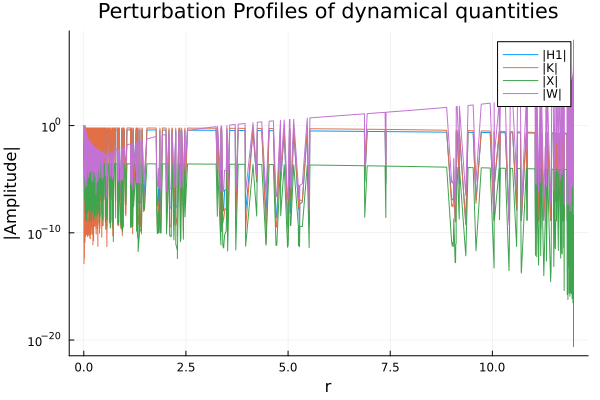

In [19]:
# Omega = 1/R
plot(r_sorted, abs.(log_data.H1[idx]), label="|H1|", yscale=:log10, xlabel="r", ylabel="|Amplitude|", title="Perturbation Profiles of dynamical quantities" )
plot!(r_sorted, abs.(log_data.K[idx]), label="|K|")
plot!(r_sorted, abs.(log_data.X[idx]), label="|X|")
plot!(r_sorted, abs.(log_data.W[idx]), label="|W|")



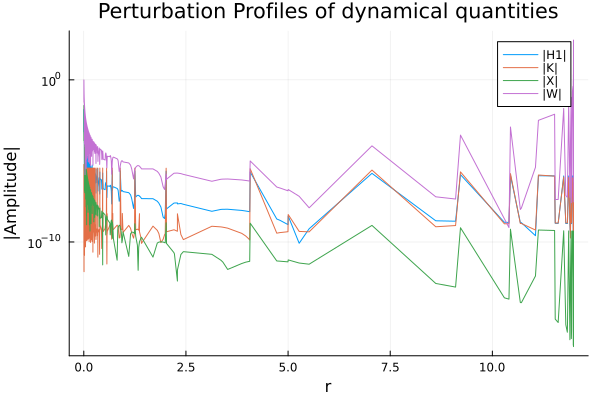

In [ ]:
# Omega = 1/R
plot(r_sorted, abs.(log_data.H1[idx]), label="|H1|", yscale=:log10, xlabel="r", ylabel="|Amplitude|", title="Perturbation Profiles of dynamical quantities" )
plot!(r_sorted, abs.(log_data.K[idx]), label="|K|")
plot!(r_sorted, abs.(log_data.X[idx]), label="|X|")
plot!(r_sorted, abs.(log_data.W[idx]), label="|W|")



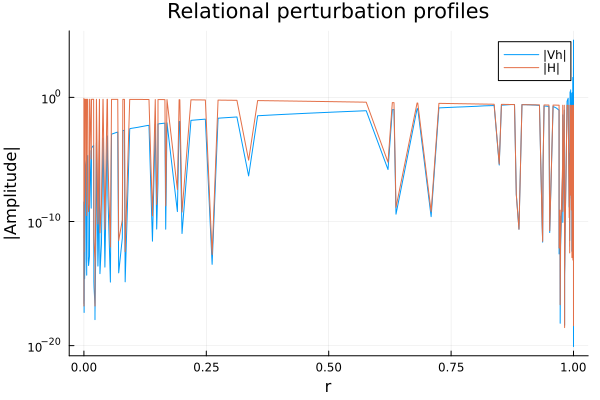

In [28]:
# Omega = 1/R
plot(r_sorted, abs.(log_data.Vh[idx]), label="|Vh|", yscale=:log10, xlabel="r", ylabel="|Amplitude|", title="Relational perturbation profiles")
plot!(r_sorted, abs.(log_data.H[idx]), label="|H|", yscale=:log10)

In [24]:
(1/R)^2

0.006960985238906171

In [ ]:
# Omega = 1e-2 / R 



In [ ]:
abs.(log_data.X[idx])/abs.(log_data.W[idx])

In [50]:
length(r_sorted), length(Xr), length(Xi)

(4200, 4200, 4200)

In [38]:
println("Current working directory: ", pwd())


Current working directory: c:\Users\Arun KG\Projects\HelloWorld\Physics


In [ ]:
X_R  = sol[end][1]
W_R  = sol[end][2]
H1_R = sol[end][3]
K_R  = sol[end][4]

print("X(R) = $X_R\n")
print("W(R) = $W_R\n")
print("H1(R) = $H1_R\n")
print("K(R) = $K_R\n")

In [ ]:
""" 
om = 1e-2/R 

reltol = 1e-10 results 
steps taken = 710
X(R) = 3.625565214021752e-12 + 0.0im
W(R) = 229251.23109723887 + 0.0im
H1(R) = 1.633238256912647e-8 + 0.0im
K(R) = -1.8492945449491628e-11 + 0.0im

reltol = 1e-8 results
steps taken = 411
X(R) = 6.051706864776051e-12 + 0.0im
W(R) = 644463.004058764 + 0.0im
H1(R) = 3.160778741355536e-8 + 0.0im
K(R) = -2.6637221421081192e-11 + 0.0im

reltol = 1e-12 results
steps taken = 10057
X(R) = -2.0397487557505348e-10 + 0.0im
W(R) = -564517.397134542 + 0.0im
H1(R) = -8.398738075775835e-7 + 0.0im
K(R) = 1.116322912478707e-9 + 0.0im

"""

In [29]:
ztest, dztest = zerilli_surface(1.6876800451143178e-9 + 0.0im, 2.2616136908723866e-9 + 0.0im, R, M)

print("Z(R) = $ztest\n", "dZ/dr(R) = $dztest\n", "Z'(R)/Z(R) = $(dztest/ztest)\n")

Z(R) = 8.271513645930422e-7 + 0.0im
dZ/dr(R) = 1.2741995186265448e-7 + 0.0im
Z'(R)/Z(R) = 0.1540467166192067 + 0.0im


In [44]:
sol

retcode: Success
Interpolation: 3rd order Hermite
t: 10057-element Vector{Float64}:
  0.002998182603896388
  0.00299819137331116
  0.0029981956106111154
  0.002998201288505261
  0.002998206966399407
  0.0029982145300357244
  0.002998219698115479
  0.0029982270792350534
  0.0029982318317488994
  0.0029982388664437027
  ⋮
 11.985734219491006
 11.985734225251734
 11.985734229116694
 11.985734231049175
 11.985734232015416
 11.985734232498537
 11.985734232820075
 11.985734232950335
 11.985734232981656
u: 10057-element Vector{Vector{ComplexF64}}:
 [9.034809337173459e-6 - 0.0im, 1.0 + 0.0im, 0.01485745433647927 + 0.0im, 8.189365642859032e-9 + 0.0im]
 [0.00028327260682843006 + 0.0im, -0.0023025635018240065 + 0.0im, -3.4218440706390574e-5 + 0.0im, 8.189120054756784e-9 + 0.0im]
 [7.622167088718337e-5 + 0.0im, -0.8588224892464033 + 0.0im, -0.012759931139693715 + 0.0im, 8.189203532345808e-9 + 0.0im]
 [-0.00025707998734216415 + 0.0im, -0.86354120439305 + 0.0im, -0.012830039272503731 + 0.0im, 8.1893

In [26]:
ztest, dztest = zerilli_surface(1.633238256912647e-8 + 0.0im + 0.0im, -1.8492945449491628e-11 + 0.0im, R, M)

print("Z(R) = $ztest\n", "dZ/dr(R) = $dztest\n", "Z'(R)/Z(R) = $(dztest/ztest)\n")

Z(R) = -6.501898443941586e-6 + 0.0im
dZ/dr(R) = 1.5496414431253243e-6 + 0.0im
Z'(R)/Z(R) = -0.23833676525188838 - 0.0im


In [30]:
M

2.39714684673559

In [26]:
R

11.985734232981656

In [33]:
M/R

0.2000000000116187

In [23]:
(2M) * (dztest/ztest) 

0.7385452019874046 + 0.0im

In [20]:
((2M/(1 - 2(M/R))) * (dztest/ztest)) 

1.2309086700266794 + 0.0im

In [33]:
(1/(1 - 2(M/R))) * dztest/ztest

1.596494175035241 + 0.0im

In [22]:
yZ_single(1.0 + 0im, bg, src)

7.65406195503493 + 0.0im

In [ ]:
ω_values = range(1e-1, 4.0, length=20)

yZ = scan_yZ(ω_values, bg, src)

abs_yZ = abs.(yZ)


plot(ω_values, abs_yZ,
     xlabel="ω",
     ylabel="|yZ|",
     lw=2)

Scanning ω  25%|███████████                              |  ETA: 3:16:31

In [24]:
Threads.nthreads()

1

In [23]:
using Base.Threads
using ProgressMeter

function scan_yZ_parallel(ω_values, bg, src)

    n = length(ω_values)

    yZ = Vector{ComplexF64}(undef, n)

    prog = Progress(n, desc="ω scan")

    @threads for i in eachindex(ω_values)

        ω = ω_values[i]

        yZ[i] = yZ_single(ω, bg, src)

        next!(prog)

    end

    return yZ
end

scan_yZ_parallel (generic function with 1 method)